This notebook contains SOTIP's spatial domain identification module using a Visium cortex dataset (joint clustering). For the steps, please refer to the table of contents automatically generated by jupyterlab on the left side bar.

author: Zhiyuan Yuan

email: 707699544@qq.com

# imports

In [2]:
from sotip import *
import numpy as np
import scanpy as sc
import scanpy.external as sce
import SpaGCN as spg


# data loading and processing steps

### load DLPFC data

In [2]:
# this data is derived from the original paper
# please refer to our supplementary table 1 for more data details
data_list = ['151673','151674','151675']
path = 'path/to/SpatialLIBD/h5ad'
adata_list = []
for d in data_list:
    adata = sc.read_h5ad(f'{path}/{d}.h5ad')
    adata_list.append(adata)





In [ ]:
adata = adata_list[0].concatenate(adata_list[1:])

In [ ]:

adata.var_names_make_unique()
spg.prefilter_genes(adata,min_cells=3) # avoiding all genes are zeros
spg.prefilter_specialgenes(adata)
#Normalize and take log for UMI
sc.pp.normalize_per_cell(adata)
sc.pp.log1p(adata)

In [ ]:
sc.pp.pca(adata)
sce.pp.harmony_integrate(adata, 'batch')

### process the data with scanpy routine

In [4]:
sc.pp.neighbors(adata,use_rep='X_pca_harmony')
sc.tl.umap(adata)
sc.tl.leiden(adata,resolution=2)

### plot clustering result and check the batch effect after harmony

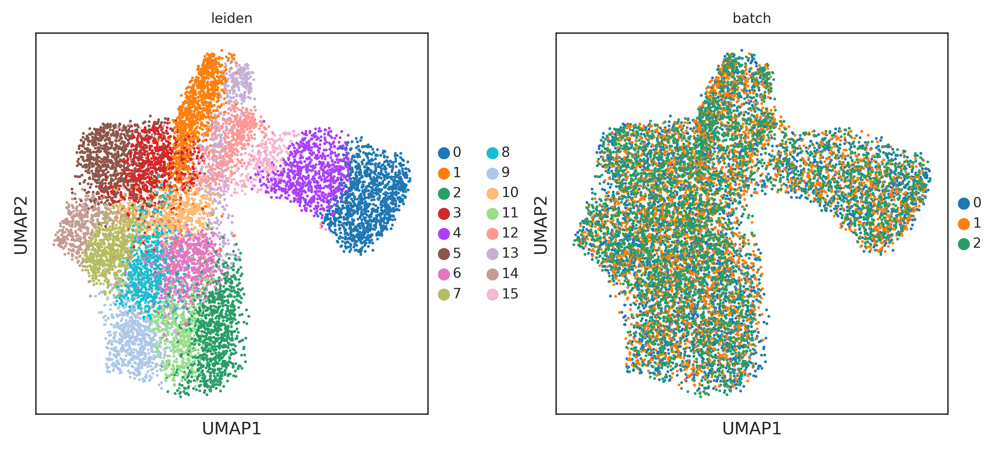

In [5]:
sc.pl.umap(adata,color=['leiden','batch'])

# SOTIP steps

### step 1: each ME is associated with its center cell

In [6]:
# ME size 
knn = 20

# spatial coordination used for ME
spatial_var='spatial'

# cluster label used for ME
cls_key='leiden'

# order of cluster label for ME representation (adata.obsm['ME'])
ME_var_names_np_unique = np.array(adata.obs[cls_key].cat.categories) 

# key function for running SDM on multiple samples,
# the batch obs is fed with "batch_obs"
MED_multi(adata,use_cls=cls_key,nn=knn,copy=False,spatial_var=spatial_var,batch_obs='batch')



knn search time cost 0.013579845428466797 s
0 MEs,time cost 5.4836273193359375e-06 s, 3639 MEs, 1.9954919815063477e-05s left
1000 MEs,time cost 0.15146636962890625 s, 2639 MEs, 0.3997197494506836s left
2000 MEs,time cost 0.15110445022583008 s, 1639 MEs, 0.2476601939201355s left
3000 MEs,time cost 0.14734244346618652 s, 639 MEs, 0.09415182137489318s left
knn search time cost 0.013759851455688477 s
0 MEs,time cost 2.86102294921875e-06 s, 3673 MEs, 1.0508537292480469e-05s left
1000 MEs,time cost 0.14723968505859375 s, 2673 MEs, 0.3935716781616211s left
2000 MEs,time cost 0.14742064476013184 s, 1673 MEs, 0.24663473868370056s left
3000 MEs,time cost 0.14582204818725586 s, 673 MEs, 0.0981382384300232s left
knn search time cost 0.013350725173950195 s
0 MEs,time cost 2.6226043701171875e-06 s, 3592 MEs, 9.420394897460938e-06s left
1000 MEs,time cost 0.1487119197845459 s, 2592 MEs, 0.38546129608154295s left
2000 MEs,time cost 0.15307855606079102 s, 1592 MEs, 0.2437010612487793s left
3000 MEs,tim

array([[ 0.,  0.,  5., ...,  0.,  0.,  0.],
       [ 0., 19.,  0., ...,  1.,  0.,  0.],
       [19.,  0.,  0., ...,  0.,  0.,  0.],
       ...,
       [18.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 9.,  0.,  0., ...,  0.,  0.,  1.]])

### step 2: Connectivity guided minimum graph distance (CGMGD)

#### step 2.1 topological structure is computed with paga

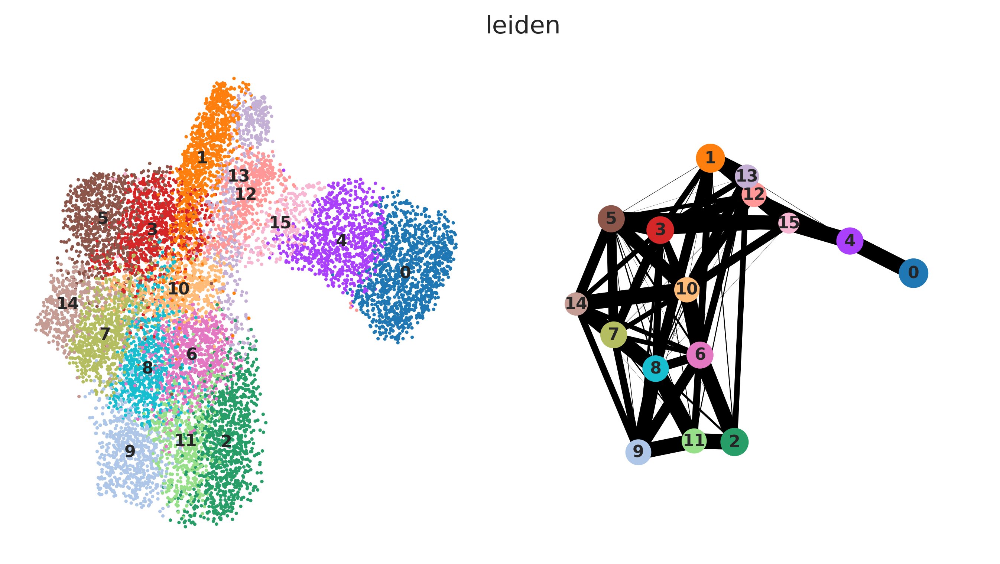

In [7]:
cls_key = 'leiden'
sc.tl.paga(adata,groups=cls_key)
sc.pl.paga_compare(adata,basis='X_umap')

#### step 2.2 the connectivities between cell clusters is used to guide the graph distance computation

In [8]:
gd_method = 'paga_guided_umap'
gd = get_ground_distance(adata,method=gd_method,cls_key=cls_key)  


### step 3 compute pairwise ME distance

In [9]:
# this step will add a X_ME_EMD_mat obsm to adata_phEMD
adata_phEMD = MED_phEMD_mp(
    adata.copy(),         # the used anndata
    GD_method=gd_method,  # use CGMGD as ground distance
    MED_knn=knn,          # ME size is set consistently as 10
    CT_obs=cls_key,       # use leiden cluster label
    ifspatialplot=False,  # do not show intermediate result plot
    OT_method='pyemd',    # use pyemd to compute EMD as ME distance
    ME_precompyted=True,  # use precomputed ME representation (already computed in step 1)
    GD_precomputed=True,  # use precomputed ground distance (already computed in step 2)
    mp=200                # multi process to accelerate the computation
)

EMD distance matrix cost 468.29136061668396s


In [10]:
# emd_distmat is the n*n pairwise ME distance
emd_distmat = (adata_phEMD.obsm['X_ME_EMD_mat'])


### step 4 construct ME graph

In [13]:
# emd_distmat is computed by step 3
adata.obsp['ME_EMD_mat'] = emd_distmat
nn=100
# compute the MEG, each node is a ME, edge is the connectivity. use similar manner as scanpy
sc.pp.neighbors( adata, n_neighbors=nn)
knn_indices, knn_dists, forest = sc.neighbors.compute_neighbors_umap( emd_distmat, n_neighbors=nn, metric='precomputed' )
adata.obsp['distances'], adata.obsp['connectivities'] = sc.neighbors._compute_connectivities_umap(
    knn_indices,
    knn_dists,
    adata.shape[0],
    nn, 
)

# set the ME graph's associated information (connectivity matrix, distance matrix) to neighbors_EMD
adata.uns['neighbors_EMD'] = adata.uns['neighbors'].copy()

### step 5 spatial domain identification

#### step 5.1 use computed MEG as input of umap and leiden clustering

In [14]:
sc.tl.umap(adata,neighbors_key='neighbors_EMD')
adata.obsm['X_umap_EMD'] = adata.obsm['X_umap']
sc.tl.leiden(adata,neighbors_key='neighbors_EMD',key_added='leiden_EMD')

#### step 5.2 Merge regions according to MEG connectivities

In [15]:
sc.tl.paga(adata,groups='leiden_EMD',neighbors_key='neighbors_EMD')
merge_cls_paga(adata,thresh=0,min_cls=7,paga_plot=False)

merged 1 to 26
merged 2 to 31
merged 9 to 13
merged 10 to 11
merged 11 to 20
merged 13 to 23
merged 15 to 18
merged 17 to 25
merged 18 to 29
merged 19 to 21
merged 20 to 22
merged 21 to 24
merged 22 to 30
merged 23 to 36
merged 24 to 28
merged 25 to 27
merged 26 to 39
merged 27 to 33
merged 28 to 32
merged 29 to 32
merged 30 to 35
merged 32 to 34
merged 33 to 36
merged 34 to 38
merged 35 to 40
merged 36 to 37
merged 37 to 42
merged 38 to 41
merged 3 to 8
merged 7 to 39
merged 4 to 40
merged 0 to 6
merged 8 to 31
merged 39 to 41
merged 6 to 40
merged 5 to 31


#### step 5.3 plot spatial domain

In [16]:
path = 'path/to/SpatialLIBD/h5ad'
adata1 = sc.read_h5ad(f'{path}/151673.h5ad')
adata2 = sc.read_h5ad(f'{path}/151674.h5ad')
adata3 = sc.read_h5ad(f'{path}/151675.h5ad')



adata1.obs['leiden_EMD_merge'] = np.array(adata[adata.obs['batch']=='0'].obs['leiden_EMD_merge'])
adata2.obs['leiden_EMD_merge'] = np.array(adata[adata.obs['batch']=='1'].obs['leiden_EMD_merge'])
adata3.obs['leiden_EMD_merge'] = np.array(adata[adata.obs['batch']=='2'].obs['leiden_EMD_merge'])






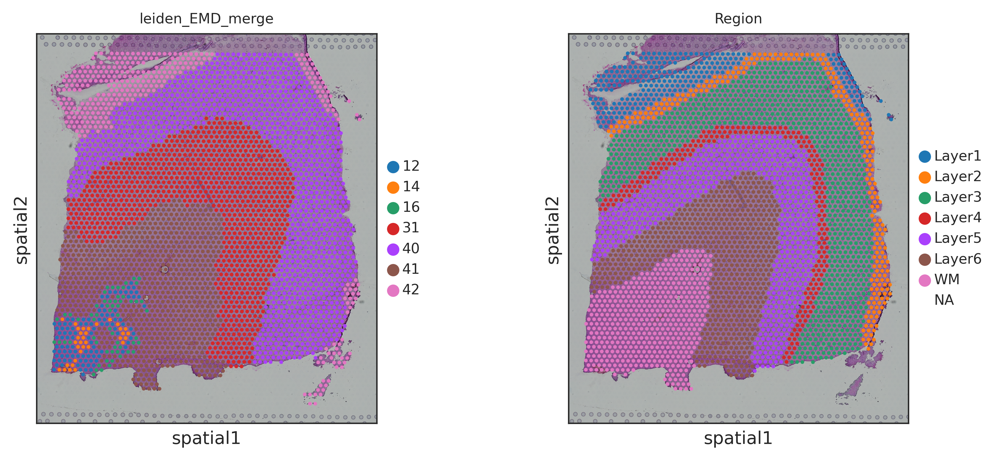

In [17]:
sc.pl.spatial(adata1,color=['leiden_EMD_merge','Region'])



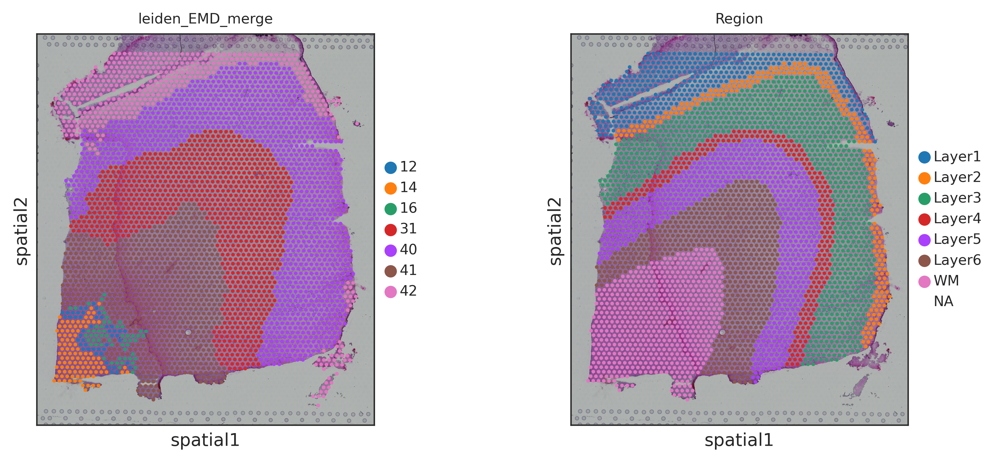

In [18]:
sc.pl.spatial(adata2,color=['leiden_EMD_merge','Region'])




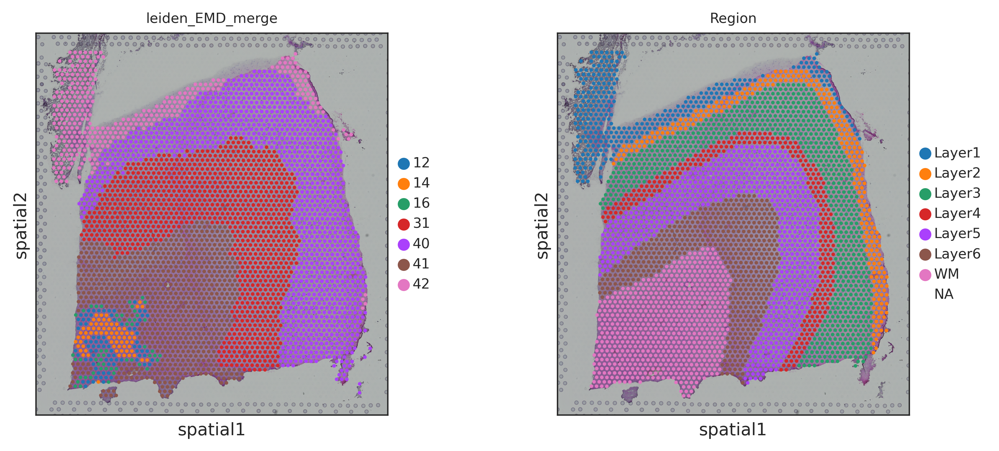

In [19]:
sc.pl.spatial(adata3,color=['leiden_EMD_merge','Region'])





#### step 5.4 ARI 

In [22]:
def compute_ari(adata):
    adata_valid = adata[np.logical_not(adata.obs['Region'].isna())]

    cur_ari = adjusted_rand_score(adata_valid.obs['leiden_EMD_merge'],adata_valid.obs['Region'])
    return cur_ari




In [24]:
compute_ari(adata1)


0.537990975825568

In [26]:
compute_ari(adata2)


0.5236312058084251

In [27]:
compute_ari(adata3)


0.46960488441165044